# Import

In [1]:
import pandas as pd
import numpy as np
import scipy
from scipy import stats
import pylab 
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.graphics import utils
sns.set()
%matplotlib inline

In [2]:
train = pd.read_csv('../data/train.csv')
weather = pd.read_csv('../data/weather.csv')
key = pd.read_csv('../data/key.csv')
test = pd.read_csv('../data/test.csv')

# 함수

In [3]:
def TM_transform(series, T_replace, M_replace):  # Temporary solution
    """
    데이터내의 T, M을 원하는 값으로 바꿔주는 함수
    TM_transform(series, T_replace)
    """
    series = series.astype(str).map(lambda s: s.strip())
    series[series == 'T'] = T_replace
    series[series == 'M'] = M_replace
    return series.astype('float')

In [4]:
def get_item_nbr(df) : # 모든 units이 0이 아닌 item_nbr을 구하는 함수, list형태로 return
    tmp = df.pivot_table(values = 'log_units', index = ['date'], columns = ['item_nbr'])
    tmp = tmp.loc[:, (tmp != 0).any(axis = 0)]
    tmp.loc['2012-12-25'] = 0 # 2012-12-25가 빠져있음 train data에서.. 그래서 log_units = 0으로 넣어줌.
    
    tmp.reset_index(inplace = True)
    tmp.sort_values(by = 'date', inplace = True)
    tmp.drop(['date'], axis = 1, inplace = True)
    
    result = list(tmp.columns)
    
    return result

In [5]:
def match_dateformat(df, year):
    """
    영문 월을 숫자 월로 바꾸어주고 나중에 사용하기 쉽도록 datetime.date 형태로 바꾸어주는 함수
    """
    months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
    for i in range(len(df)):
        dates = df.loc[i][0]
        dates = dates.split(" ")
        for j in range(len(months)):
            if dates[0] == months[j]:
                dates[0] = str(j + 1)
                dates_df = ["{} {} {}".format(year, dates[0], dates[1])]
                dates_df = pd.to_datetime(dates_df)
                df.loc[i][0] = dates_df.date[0]
    return df

In [6]:
def merge_holiday(holiday_df1, holiday_df2, holiday_df3):
    """
    각 연도별 공휴일 리스트 합치기
    """
    frame = [holiday_df1, holiday_df2, holiday_df3]
    holiday = pd.concat(frame).reset_index(drop=True)
    return holiday

def find_holiday(file, year):
    """
    수요에 영향을 미치는 주요 공휴일을 찾아내는 함수
    """
    holidays = ["New Year's Day", "Martin Luther King Jr. Day", "Valentine's Day",  "President's Day", "Easter Sunday", 
                      "Mother's Day", "Memorial Day", "Father's Day", "Independence Day", "Labor Day", "Columbus Day",
                      "Halloween", "Veterans Day", "Thanksgiving Day", "Black Friday", "Christmas Eve", "Christmas Day", "New Year's Eve"]
    
    holi = pd.read_excel(file, year, header=None)
    holi = match_dateformat(holi, year)
    holiday = pd.DataFrame(columns=[0,1,2,3,4])
    for _ in holidays:
        for i in range(len(holi[2])):
            if _ == holi[2][i]:
                holiday = holiday.append(holi.loc[i])
    return holiday

def cs_preprocessing(codesum):
    codesum_temp = []
    for _ in codesum:
        _ = _.replace('+', '')
        _ = _.replace('-', '')
        if len(_) > 2:
            _1 = _[:2]
            codesum_temp.append(_1)
            _2 = _[2:]
            codesum_temp.append(_2)
        else:
            codesum_temp.append(_)
    codesum = codesum_temp
    return codesum

def weather_flagger(weather):
    codesum_ls = ['FC', 'TS', 'GR', 'RA', 'DZ', 'SN', 'SG', 'GS', 'PL', 'IC', 'FG', 'BR', 'UP', 'HZ', 'FU', 'VA', 'DU', 'DS', 'PO', 'SA', 'SS', 'PY', 'SQ', 'DR', 'SH', 'FZ', 'MI', 'PR', 'BC', 'BL', 'VC']
    weather['date'] = pd.to_datetime(weather['date']) #weather는 글로벌변수
    for i in range(len(weather['codesum'])):
        codesum = weather['codesum'][i].split(" ")
        codesum = cs_preprocessing(codesum)
        for _ in codesum:
            flag = any(code in _ for code in codesum_ls)
            if flag == True:
                weather.set_value(i, '{}_flag'.format(_), 1)
            else:
                weather.set_value(i, 'normal_flag', 1)
    weather['snowfall'] = TM_transform(weather['snowfall'], 0.02, 0.0)
    weather['preciptotal'] = TM_transform(weather['preciptotal'], 0.02, 0.0)
    weather['snow_event'] = np.where(np.where(weather['SN_flag'] == 1, 1, 0) + np.where(weather['snowfall'] > 2, 1, 0) == 2, 1, 0)
    weather['rain_event'] = np.where(np.where(weather['RA_flag'] == 1, 1, 0) + np.where(weather['preciptotal'] > 1, 1, 0) == 2, 1, 0)
    weather['event'] = weather['snow_event'] + weather['rain_event']
    weather['event'] = np.where(weather['event'] >= 1, 1, 0)
    return weather

def preprocessing(df, holiday, weather):
    """
    train데이터를 가공하는 함수
    """
    df['log_units'] = np.log(df['units'] + 1) # logged units
    df['date'] = pd.to_datetime(df['date'])
    df['weekday'] = df.date.dt.weekday  # 월요일이 0 일요일이 6
    df['weekend'] = df.date.dt.weekday.isin([5, 6])  # 5: 토요일, 6: 일요일

    df['holiday'] = df.date.isin(holiday[0])
    df['weekday_holiday'] = df.holiday & (df.weekend == False)
    df['weekend_holiday'] = df.holiday & df.weekend
    
    df = pd.merge(df, key, on='store_nbr') #key는 글로벌 변수
    df = pd.merge(df, weather[['date', 'station_nbr', 'tmax', 'tmin', 'tavg', 'depart', 'dewpoint', 'wetbulb', 'heat', 'cool',
                               'sunrise', 'sunset', 'codesum', 'snowfall', 'preciptotal', 'stnpressure', 'sealevel', 'resultspeed',
                               'resultspeed', 'resultdir', 'avgspeed' ,'event']], on=['date', 'station_nbr'])
    return df

def test_preprocessing(df, holiday, weather):
    weather = weather_flagger(weather)
    df['date'] = pd.to_datetime(df['date'])
    df['weekday'] = df.date.dt.weekday  # 월요일이 0 일요일이 6
    df['weekend'] = df.date.dt.weekday.isin([5, 6])  # 5: 토요일, 6: 일요일

    df['holiday'] = df.date.isin(holiday[0])
    df['weekday_holiday'] = df.holiday & (df.weekend == False)
    df['weekend_holiday'] = df.holiday & df.weekend
    
    df = pd.merge(df, key, on='store_nbr') #key는 글로벌 변수
    df = pd.merge(df, weather[['date', 'station_nbr', 'tmax', 'tmin', 'tavg', 'depart', 'dewpoint', 'wetbulb', 'heat', 'cool',
                               'sunrise', 'sunset', 'codesum', 'snowfall', 'preciptotal', 'stnpressure', 'sealevel', 'resultspeed',
                               'resultspeed', 'resultdir', 'avgspeed' ,'event']], on=['date', 'station_nbr'])
    return df

In [7]:
def by_store(df, nbr) :
    df_new = df[df['store_nbr'] == nbr]
    df_new.reset_index(drop = True, inplace = True)
    
    return df_new

## 데이터 전처리

In [8]:
train_df = train[train['date'] <= '2013-03-31'].reset_index(drop=True)

In [9]:
weather_df = weather[weather['date'] <= '2013-03-31'].reset_index(drop = True)

In [10]:
holiday12 = find_holiday('../data/holiday.xlsx', '2012')
holiday13 = find_holiday('../data/holiday.xlsx', '2013')
holiday14 = find_holiday('../data/holiday.xlsx', '2014')
holiday = merge_holiday(holiday12, holiday13, holiday14)
weather_df = weather_flagger(weather_df)
processed_train = preprocessing(train, holiday, weather_df)
processed_test = test_preprocessing(test, holiday, weather)

# 데이터 분포 알아보기

### EDA

OLS의 기본 가정인 종속 변수 y가 독립변수 x의 선형 조합으로 결정되는 기댓값과 고정된 분산 $\sigma^{2}$를 가지는 정규 분포인지 알아보자

In [11]:
train_norm_test = train_df.pivot_table(values='units', index=['store_nbr', 'date'], columns=['item_nbr'])
train_df['log_units'] = np.log(train_df['units'] + 1)
train_norm_test_log = train_df.pivot_table(values='log_units', index=['store_nbr', 'date'], columns=['item_nbr'])

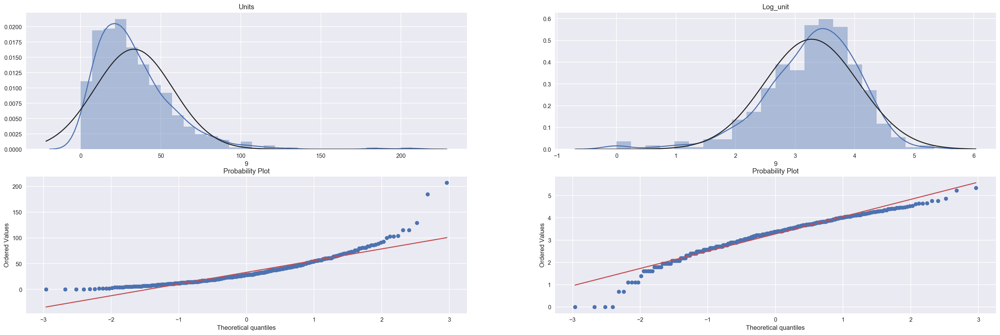

Unit - test statistic: 0.9766720799903479, p-value: 0.0
Log Unit - test statistic: 0.9282494129181219, p-value: 0.0
Unit - Skewness: 2.087893
Unit - Kurtosis: 8.870343
Log Unit - Skewness: -0.976611
Log Unit - Kurtosis: 2.201097


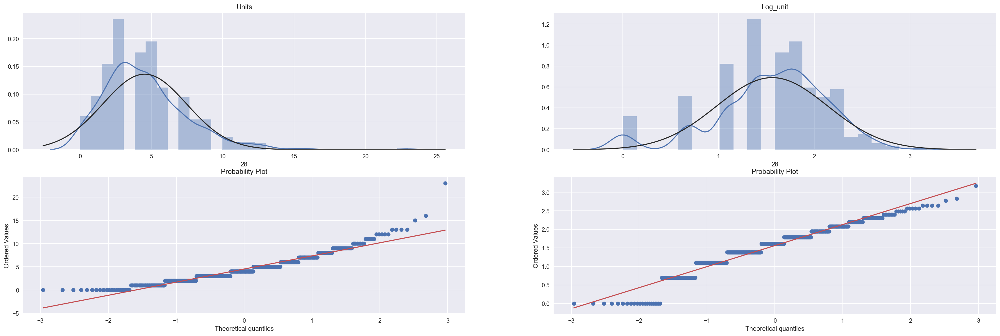

Unit - test statistic: 0.8563707471726999, p-value: 0.0
Log Unit - test statistic: 0.7431522714794547, p-value: 0.0
Unit - Skewness: 1.278333
Unit - Kurtosis: 3.772476
Log Unit - Skewness: -0.691252
Log Unit - Kurtosis: 0.702722


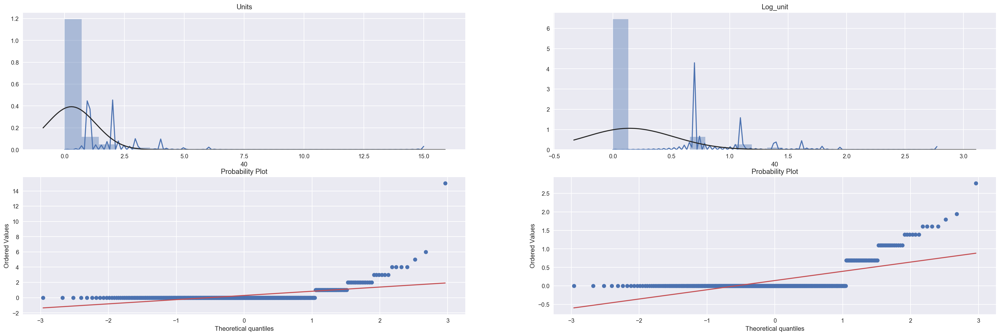

Unit - test statistic: 0.5, p-value: 0.0
Log Unit - test statistic: 0.5, p-value: 0.0
Unit - Skewness: 8.195055
Unit - Kurtosis: 100.935579
Log Unit - Skewness: 2.944335
Log Unit - Kurtosis: 9.633112


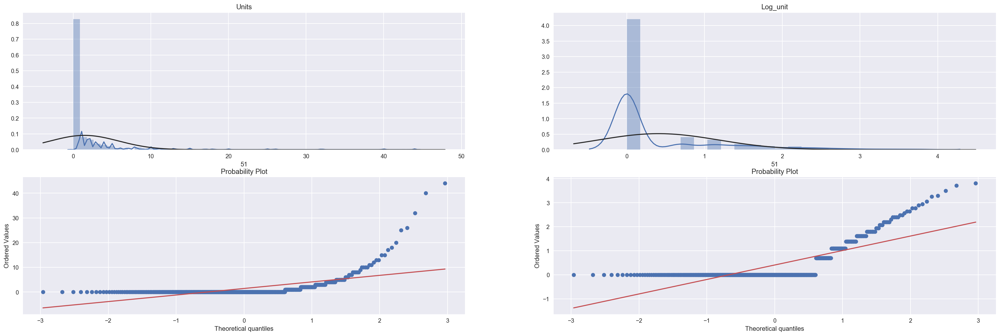

Unit - test statistic: 0.5, p-value: 0.0
Log Unit - test statistic: 0.5, p-value: 0.0
Unit - Skewness: 5.702487
Unit - Kurtosis: 40.949874
Log Unit - Skewness: 1.984351
Log Unit - Kurtosis: 3.401054


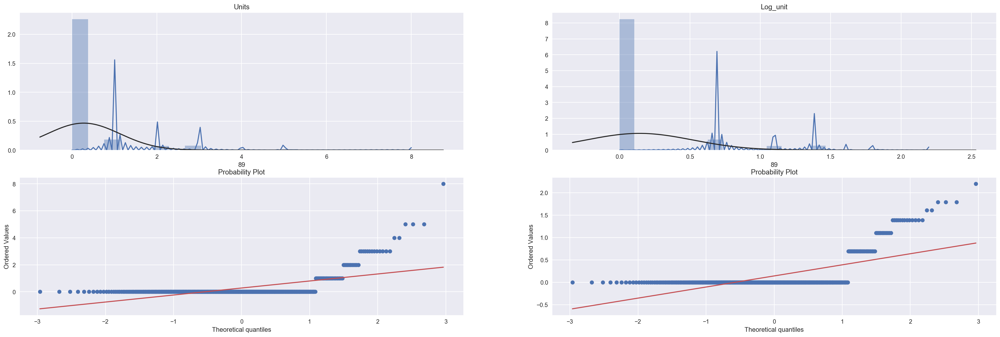

Unit - test statistic: 0.5, p-value: 0.0
Log Unit - test statistic: 0.5, p-value: 0.0
Unit - Skewness: 4.250969
Unit - Kurtosis: 22.960395
Log Unit - Skewness: 2.767661
Log Unit - Kurtosis: 7.073234


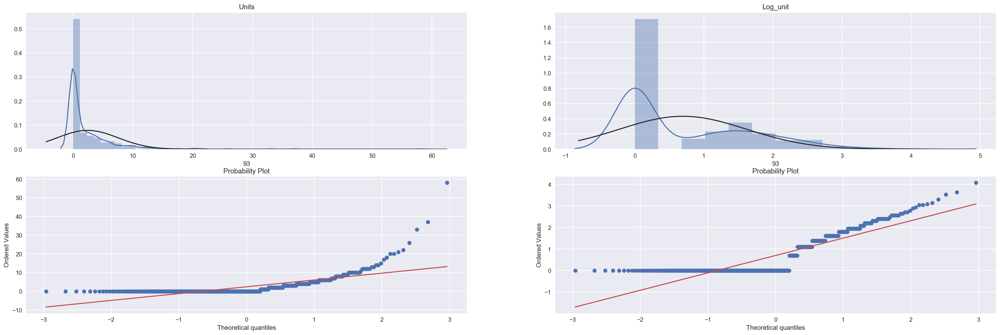

Unit - test statistic: 0.5, p-value: 0.0
Log Unit - test statistic: 0.5, p-value: 0.0
Unit - Skewness: 5.042979
Unit - Kurtosis: 39.388447
Log Unit - Skewness: 1.004291
Log Unit - Kurtosis: -0.076858


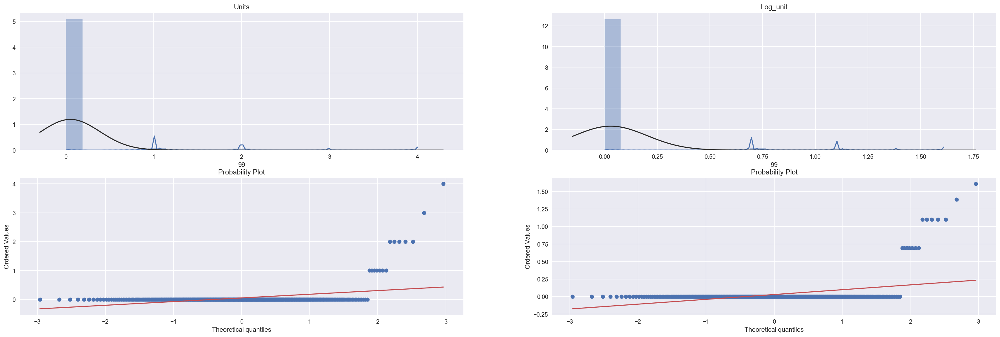

Unit - test statistic: 0.5, p-value: 0.0
Log Unit - test statistic: 0.5, p-value: 0.0
Unit - Skewness: 7.693384
Unit - Kurtosis: 67.710648
Log Unit - Skewness: 6.283348
Log Unit - Kurtosis: 41.083234


In [12]:
# Let's draw per item_nbr per store_nbr * with units
for i in range(1,2):  #원래는 1~45
    temp = []
    temp2 = []
    t = []
    temp = train_norm_test.loc[i]
    temp2 = train_norm_test_log.loc[i]
    temp = temp.loc[:, (temp !=0).any(axis=0)]
    temp2 = temp2.loc[:, (temp2 !=0).any(axis=0)]
    t = list(temp.columns)
    for j in t:
        plt.figure(figsize = (30, 20))
        plt.subplot(4,2,1)
        sns.distplot(temp[j], kde=True, fit=scipy.stats.norm)
        plt.title('Units')
        plt.subplot(4,2,2)
        sns.distplot(temp2[j], kde=True, fit=scipy.stats.norm)
        plt.title('Log_unit')
        plt.subplot(4,2,3)
        scipy.stats.probplot(temp[j], dist="norm", plot=pylab)
        plt.subplot(4,2,4)
        scipy.stats.probplot(temp2[j], dist="norm", plot=pylab)
        pylab.show()
        result_ks = scipy.stats.kstest(temp[j], cdf='norm')
        result_ks_log = scipy.stats.kstest(temp2[j], cdf='norm')
        print('Unit - test statistic: {}, p-value: {}'.format(result_ks[0], result_ks[1]))
        print('Log Unit - test statistic: {}, p-value: {}'.format(result_ks_log[0], result_ks_log[1]))
        print("Unit - Skewness: %f" % temp[j].skew())
        print("Unit - Kurtosis: %f" % temp[j].kurt())
        print("Log Unit - Skewness: %f" % temp2[j].skew())
        print("Log Unit - Kurtosis: %f" % temp2[j].kurt())
    # It seems like improving the normality!

로그를 취하지 않은 종속변수 y값은 한쪽으로 치우친 값이 많아(0) 정규분포를 따르지 않으나 로그를 취한 후에는 이전보다 정규분포에
조금 더 다가간 것을 확인 할 수 있다.

로그를 취한 유닛으로 시간별 판매량을 플롯함으로써 추세, 계절성이 있는지 알아보자

여기에서 UCL은 평균값에 2 Sigma를 더한값이라 하고, 범위안에 속하지 못하는 데이터는 odd하다고 가정한다. (95.45%) 

C:\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
C:\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


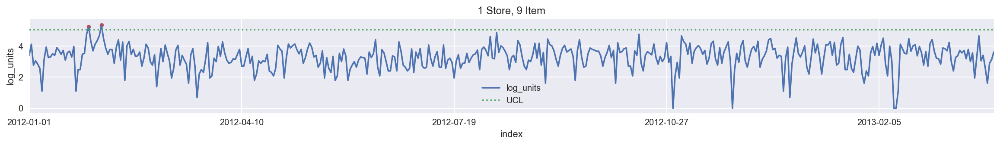

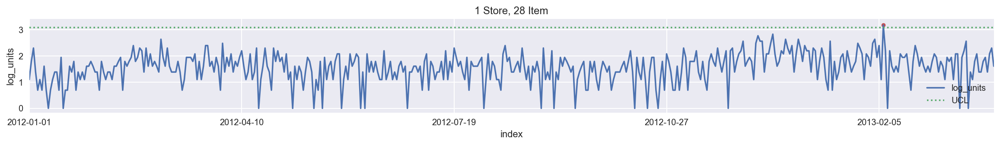

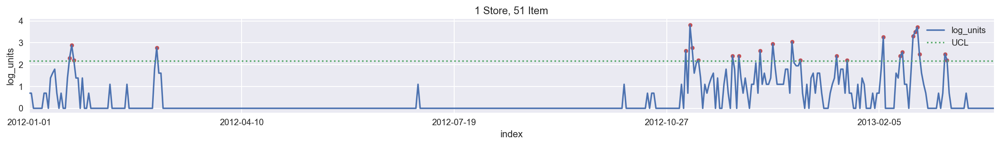

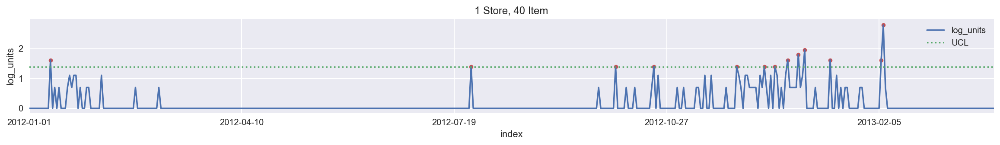

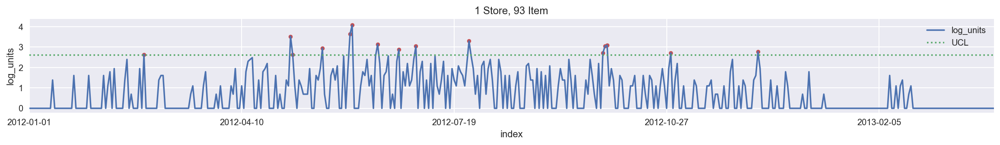

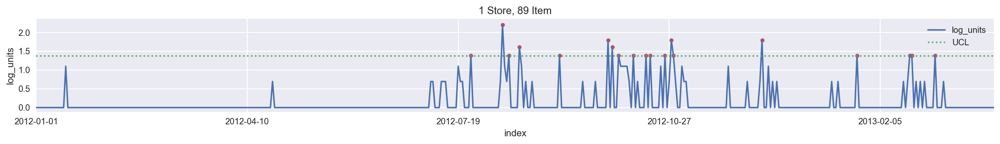

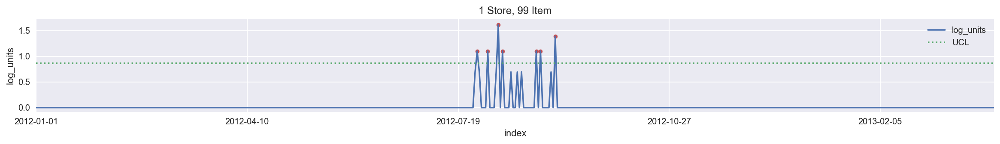

In [13]:
for i in range(1, 2): #원래는 1~45
    tmp = []
    tmp = train_df[train_df['store_nbr'] == i]
    tmp_sold = tmp[tmp['units'] > 0]
    tmp = pd.concat([tmp[tmp['item_nbr'] == num] for num in tmp_sold['item_nbr'].unique()])
    for j in tmp['item_nbr'].unique():
        tmp_item = []
        tmp_item = tmp[tmp['item_nbr'] == j]
        tmp_item['index'] = [k for k in range(len(tmp_item))]
        mean = tmp_item['log_units'].mean()
        std = tmp_item['log_units'].std()
        sig = np.sqrt(std)
        UCL = (sig*2) + mean # 2sigma 95.45%
        tmp_item['UCL'] = UCL
        tmp_item_odd = tmp_item[tmp_item['log_units'] > UCL]
        ax = tmp_item.plot(x='date', y='log_units', kind='line', figsize=(20,2), title=('{} Store, {} Item'.format(i, j)))
        tmp_item.plot(x='date', y='UCL', kind='line', style=':', ax=ax)
        if len(tmp_item_odd) != 0:
            tmp_item_odd.plot(x='index', y='log_units', kind='scatter', color='r', ax=ax)
#          plt.title('{} Store, {} Item'.format(i, j))
        plt.show()

이 oddity는 어디서 나온 것일까? 요일별로 판매량이 다른지 알아보자

C:\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:57: FutureWarning: reshape is deprecated and will raise in a subsequent release. Please use .values.reshape(...) instead
  return getattr(obj, method)(*args, **kwds)


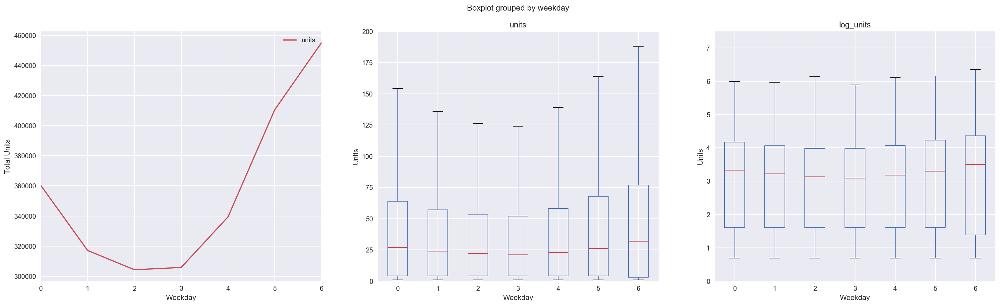

In [14]:
processed_train_f1 = processed_train.pivot_table(values='units', index=['weekday'], aggfunc=np.sum)
processed_train_f2 = processed_train[processed_train['units'] > 0].reset_index(drop=True)
processed_train_f3 = processed_train[processed_train['log_units'] > 0].reset_index(drop=True)


fig, axes = plt.subplots(nrows=1, ncols=3, figsize = (25, 7))
# unit vs weekday
processed_train_f1.plot(kind='line', style='r', ax=axes[0])
# axes[1].set_ylim([0,200])
plt.xticks(rotation=0)
axes[0].set_ylabel('Total Units')
axes[0].set_xlabel('Weekday')
processed_train_f2.boxplot("units", "weekday", ax=axes[1])
axes[1].set_ylim([0,200])
plt.xticks(rotation=0)
axes[1].set_ylabel('Units')
axes[1].set_xlabel('Weekday')
processed_train_f3.boxplot("log_units", "weekday", ax=axes[2])
axes[2].set_ylim([0,7.5])
plt.xticks(rotation=0)
axes[2].set_ylabel('Units')
axes[2].set_xlabel('Weekday')
plt.show()

유닛의 총량으로 보았을때는 차이가 분명히 나타나지만 boxplot으로 보았을때 커다란 차이점을 보기는 힘들다. (특히 유닛에 로그를 취했을 경우)

In [15]:
processed_train = preprocessing(train_df, holiday, weather_df)
processed_train['date'] = processed_train['date'].apply(lambda x:x.date().strftime('%Y-%m-%d'))

C:\Anaconda3\lib\site-packages\ipykernel_launcher.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
C:\Anaconda3\lib\site-packages\ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


Satday: 1
Sunday: 1


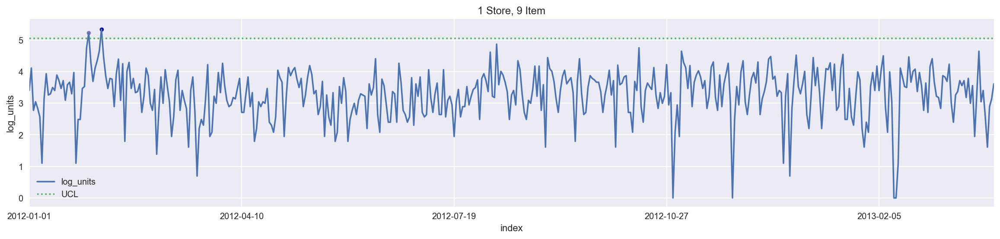

Thurday: 1


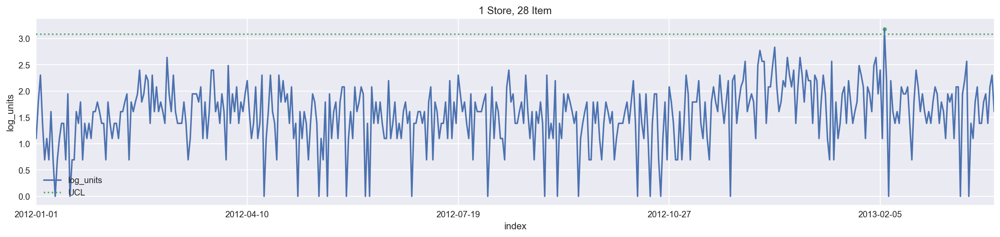

Monday: 3
Tuesday: 1
Wednsday: 3
Thurday: 4
Friday: 5
Satday: 4
Sunday: 5


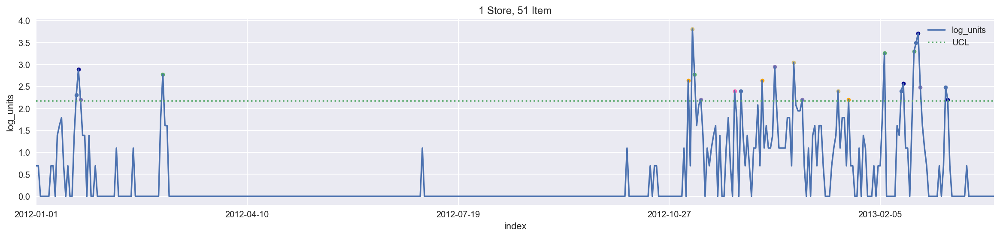

Monday: 1
Tuesday: 1
Wednsday: 4
Thurday: 2
Friday: 1
Satday: 1
Sunday: 3


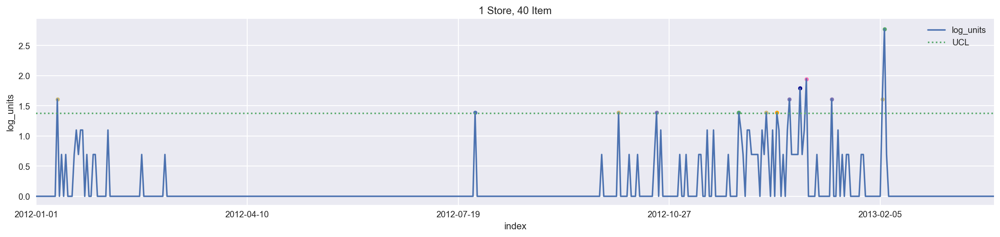

Monday: 1
Wednsday: 1
Thurday: 4
Friday: 5
Satday: 2
Sunday: 2


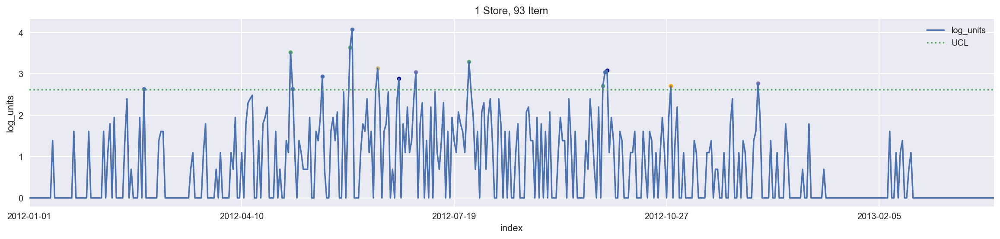

Monday: 2
Tuesday: 2
Wednsday: 5
Thurday: 3
Friday: 3
Sunday: 4


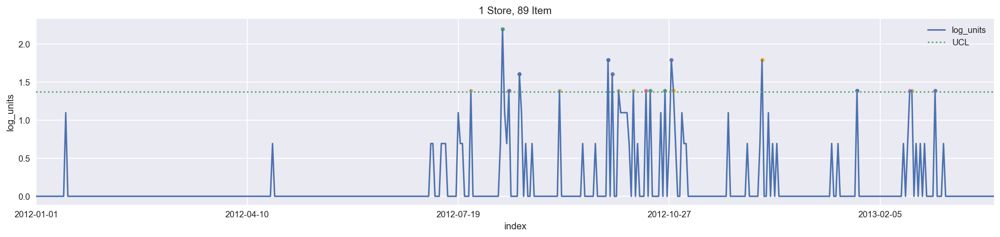

Monday: 2
Tuesday: 1
Thurday: 2
Satday: 2


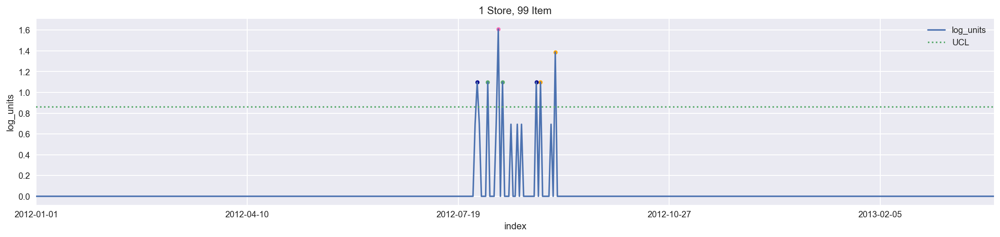

In [16]:
for i in range(1, 2):  #원래는 1~45
    tmp = []
    tmp_sold = []
    tmp = processed_train[processed_train['store_nbr'] == i]
    tmp_sold = tmp[tmp['log_units'] > 0]
    tmp = pd.concat([tmp[tmp['item_nbr'] == num] for num in tmp_sold['item_nbr'].unique()])
    for j in tmp['item_nbr'].unique():
        tmp_item = []
        tmp_item_odd = []
        tmp_item_mon = []
        tmp_item_tue = []
        tmp_item_wed = []
        tmp_item_thu = []
        tmp_item_fri = []
        tmp_item_sat = []
        tmp_item_sun = []
        tmp_item = tmp[tmp['item_nbr'] == j]
        tmp_item['index'] = [k for k in range(len(tmp_item))]
        mean = tmp_item['log_units'].mean()
        std = tmp_item['log_units'].std()
        sig = np.sqrt(std)
        UCL = (sig*2) + mean # 2sigma 95.45%
        tmp_item['UCL'] = UCL
        tmp_item_odd = tmp_item[tmp_item['log_units'] > UCL]
        tmp_item_mon = tmp_item_odd[tmp_item_odd['weekday'] == 0]
        tmp_item_tue = tmp_item_odd[tmp_item_odd['weekday'] == 1]
        tmp_item_wed = tmp_item_odd[tmp_item_odd['weekday'] == 2]
        tmp_item_thu = tmp_item_odd[tmp_item_odd['weekday'] == 3]
        tmp_item_fri = tmp_item_odd[tmp_item_odd['weekday'] == 4]
        tmp_item_sat = tmp_item_odd[tmp_item_odd['weekday'] == 5]
        tmp_item_sun = tmp_item_odd[tmp_item_odd['weekday'] == 6]
        ax = tmp_item.plot(x='date', y='log_units', kind='line', figsize=(20,4), title=('{} Store, {} Item'.format(i, j)))
        tmp_item.plot(x='date', y='UCL', kind='line', style=':', ax=ax)
        if len(tmp_item_odd) != 0:
            tmp_item_odd.plot(x='index', y='log_units', kind='scatter', color='r', alpha='0.0', ax=ax)
            if len(tmp_item_mon) != 0:
                tmp_item_mon.plot(x='index', y='log_units', kind='scatter', color='#FFA500', ax=ax) # orange
                print('Monday: {}'.format(len(tmp_item_mon)))

            if len(tmp_item_tue) != 0:
                tmp_item_tue.plot(x='index', y='log_units', kind='scatter', color='#FF69B4', ax=ax) # pink
                print('Tuesday: {}'.format(len(tmp_item_tue)))

            if len(tmp_item_wed) !=0:
                tmp_item_wed.plot(x='index', y='log_units', kind='scatter', color='y', ax=ax)
                print('Wednsday: {}'.format(len(tmp_item_wed)))

            if len(tmp_item_thu) != 0:
                tmp_item_thu.plot(x='index', y='log_units', kind='scatter', color='g', ax=ax)
                print('Thurday: {}'.format(len(tmp_item_thu)))

            if len(tmp_item_fri) != 0:
                tmp_item_fri.plot(x='index', y='log_units', kind='scatter', color='b', ax=ax)
                print('Friday: {}'.format(len(tmp_item_fri)))

            if len(tmp_item_sat) != 0:
                tmp_item_sat.plot(x='index', y='log_units', kind='scatter', color='#00008B', ax=ax) # darkblue
                print('Satday: {}'.format(len(tmp_item_sat)))

            if len(tmp_item_sun) != 0:    
                tmp_item_sun.plot(x='index', y='log_units', kind='scatter', color='m', ax=ax)            
                print('Sunday: {}'.format(len(tmp_item_sun)))
                           
            plt.show()
        plt.show()

공휴일이 미치는 영향도 알아보자

In [17]:
train_df_holiday = train_df[train_df['holiday'] == True].reset_index(drop = True)
train_df_nonholiday = train_df[train_df['holiday'] == False].reset_index(drop = True)

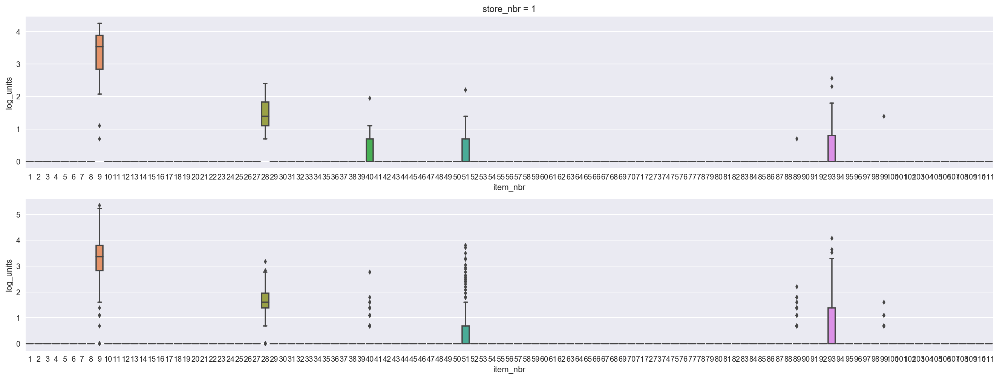

In [18]:
for i in range(1, 2) : # 1 ~ 45
    plt.subplots(figsize = (23, 400))
    plt.subplot(90, 1, i)
    sns.boxplot(x = 'item_nbr', y = 'log_units', data = by_store(train_df_holiday, i))
        
    plt.title('store_nbr = {}'.format(i))
    
    plt.subplot(90, 1, i + 1)
    sns.boxplot(x = 'item_nbr', y = 'log_units', data = by_store(train_df_nonholiday, i))
    
plt.show()

C:\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:57: FutureWarning: reshape is deprecated and will raise in a subsequent release. Please use .values.reshape(...) instead
  return getattr(obj, method)(*args, **kwds)


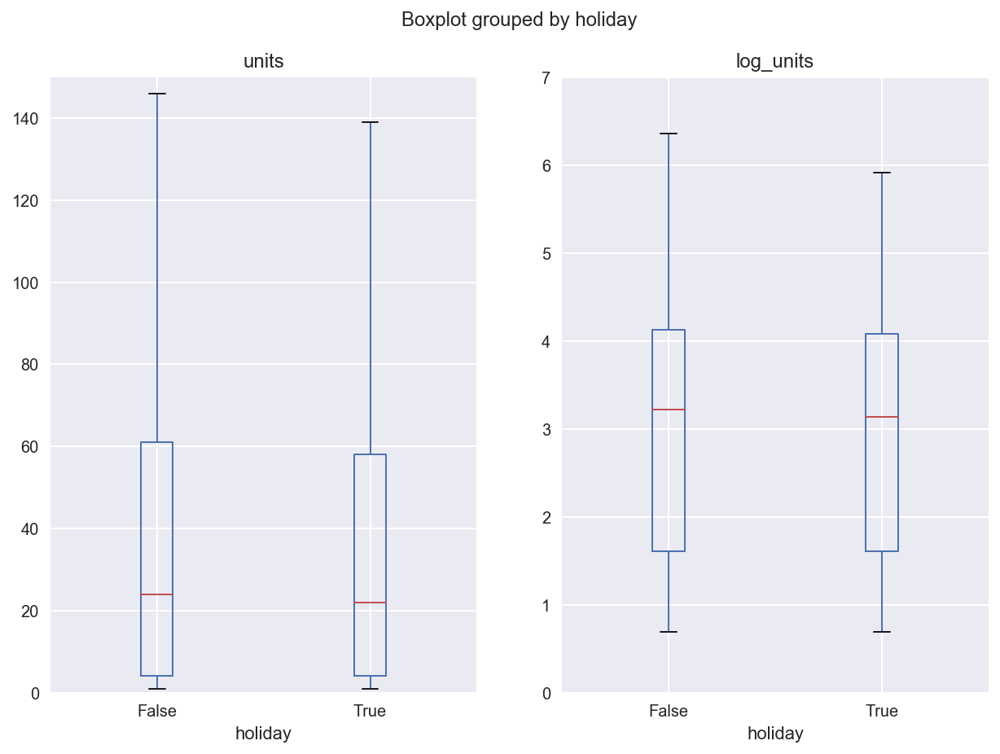

In [19]:
processed_train_f4 = processed_train[processed_train['units'] > 0]
processed_train_f5 = processed_train[processed_train['log_units'] > 0]
fig, axes = plt.subplots(nrows=1, ncols=2, figsize = (10, 7))
processed_train_f4.boxplot("units", "holiday", ax=axes[0])
axes[0].set_ylim([0,150])
processed_train_f5.boxplot("log_units", "holiday", ax=axes[1])
axes[1].set_ylim([0,7])
plt.show()

그렇다면 이 odd한 날이 weather의 영향을 받은 날일까? 

문제에서 preciptotal이 1이상 snowfall이 2이상인날을 weather event, 즉 stormy weather한 날이라고 정의하였다. 

이 날짜에 맞춰 event가 발생하였다고 가정한다.

In [20]:
event_pivot_station_train = processed_train.pivot_table(values='event', index='date', columns='station_nbr')
event_pivot_station_test = processed_test.pivot_table(values='event', index='date', columns='station_nbr')
event_pivot_store_train = processed_train.pivot_table(values='event', index='date', columns='store_nbr')
event_pivot_store_test = processed_test.pivot_table(values='event', index='date', columns='store_nbr')
event_pivot_station_train = pd.DataFrame(event_pivot_station_train.to_records())
event_pivot_station_test = pd.DataFrame(event_pivot_station_test.to_records())
event_pivot_store_train = pd.DataFrame(event_pivot_store_train.to_records())
event_pivot_store_test = pd.DataFrame(event_pivot_store_test.to_records())

위에서 플롯한 추세, 계절성 플롯에서 odd한 값들이 event에 영향을 받은것인지 알아보기 위해 같은 플롯을 그려보자

event는 초록색 odd는 빨간색 둘이 겹치는 부분은 두색의 합으로 나타난다.

C:\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
C:\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


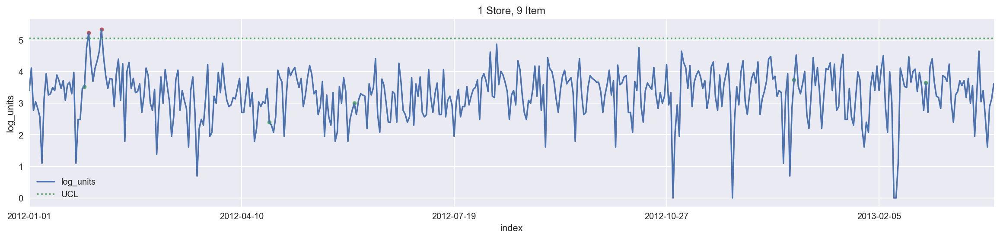

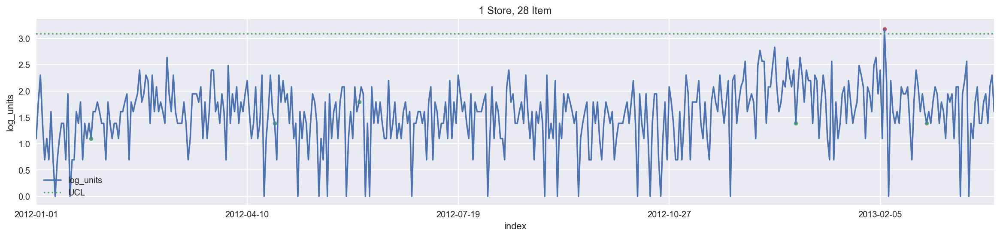

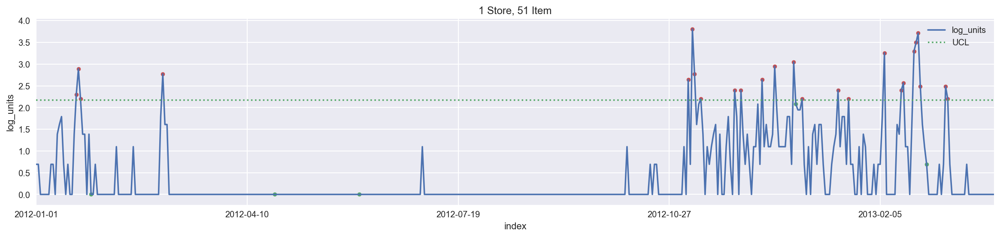

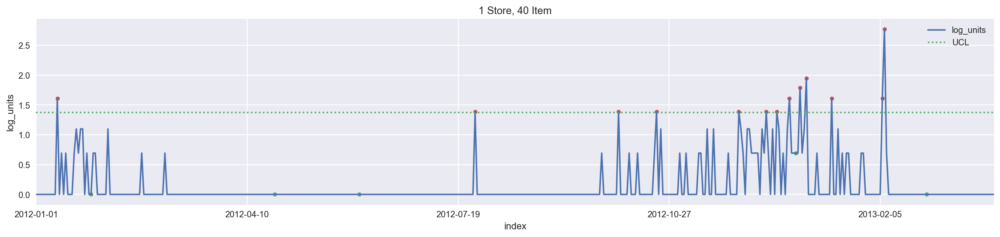

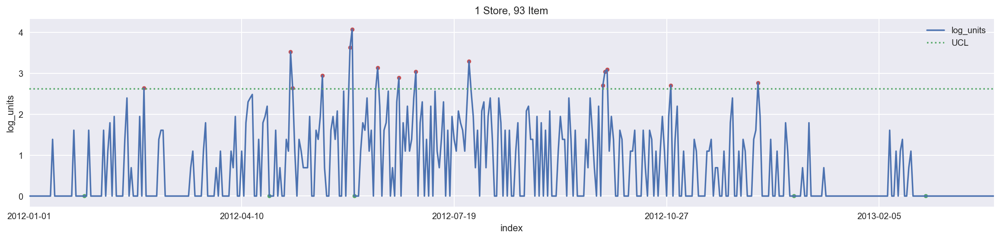

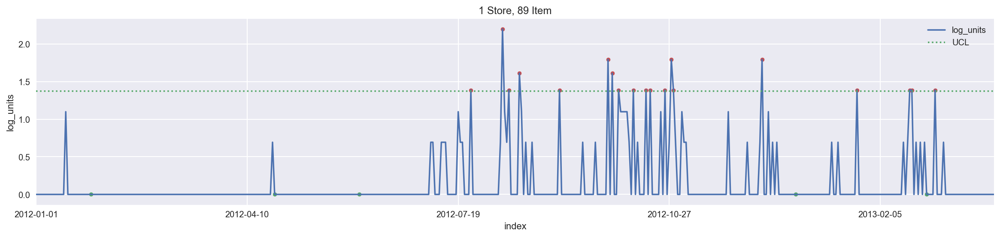

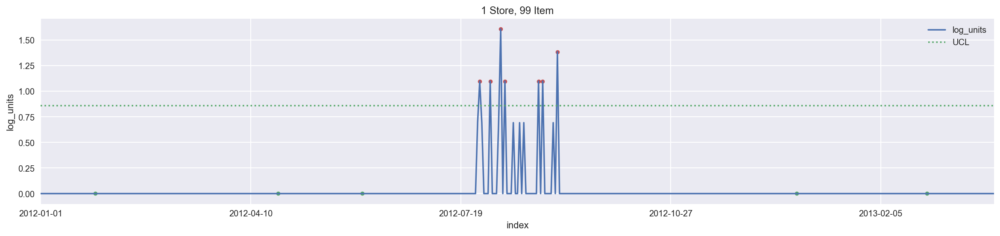

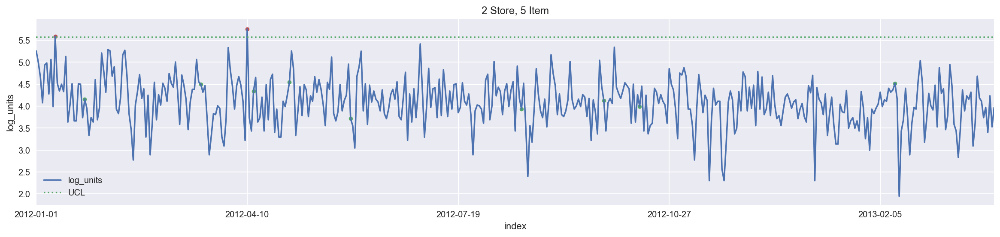

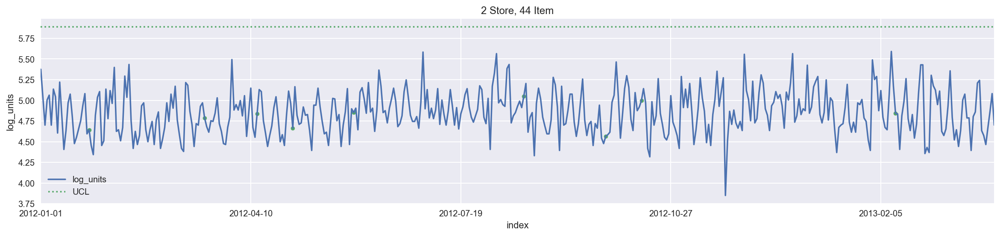

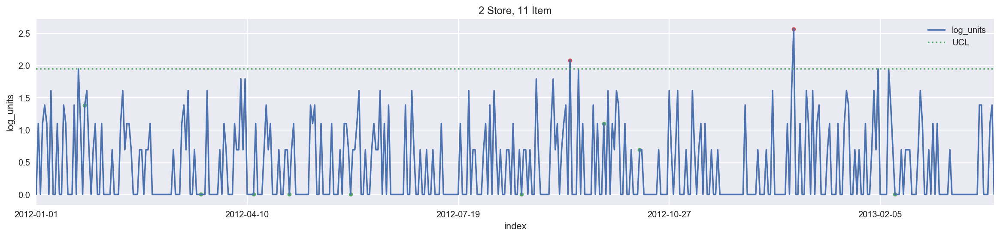

Warning! : 85221     2012-03-19
177573    2012-10-13
Name: date, dtype: object, Match: 2


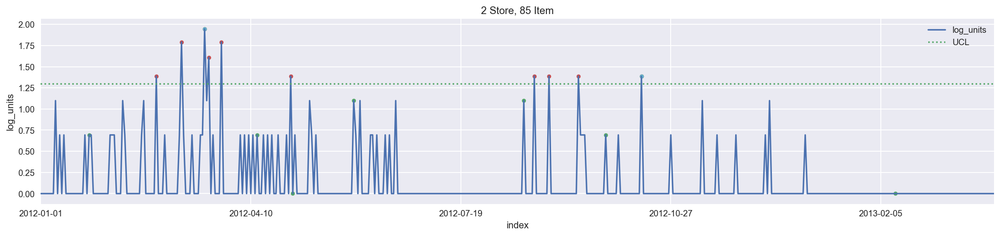

Warning! : 152717    2012-08-18
Name: date, dtype: object, Match: 1


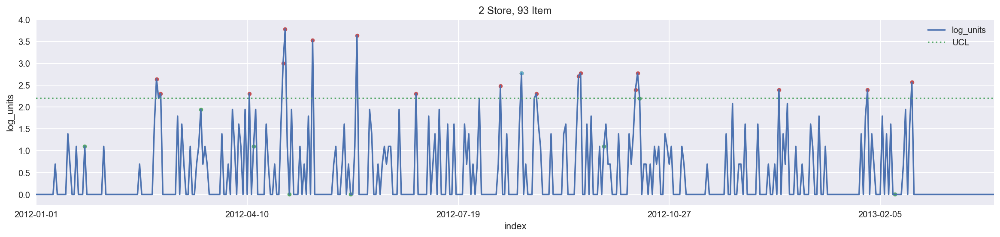

In [21]:
for i in range(1, 3): #원래는 1~45
    tmp = []
    tmp_item_flag = []
    tmp = processed_train[processed_train['store_nbr'] == i]
    tmp_sold = tmp[tmp['log_units'] > 0]
    tmp = pd.concat([tmp[tmp['item_nbr'] == num] for num in tmp_sold['item_nbr'].unique()])
    for j in tmp['item_nbr'].unique():
        tmp_item = tmp[tmp['item_nbr'] == j]
        tmp_item['index'] = [k for k in range(len(tmp_item))]
        mean = tmp_item['log_units'].mean()
        std = tmp_item['log_units'].std()
        sig = np.sqrt(std)
        UCL = (sig*2) + mean # 2sigma 95.45%
        tmp_item['UCL'] = UCL
        tmp_item_odd = tmp_item[tmp_item['log_units'] > UCL]
        tmp_item_event = tmp_item[tmp_item['event'] > 0]
        tmp_item_flag = tmp_item_event[tmp_item_event['log_units'] > UCL]
        ax = tmp_item.plot(x='date', y='log_units', kind='line', figsize=(20,4), title=('{} Store, {} Item'.format(i, j)))
        tmp_item.plot(x='date', y='UCL', kind='line', style=':', ax=ax)
        if len(tmp_item_odd) != 0:
            tmp_item_event.plot(x='index', y='log_units', kind='scatter', color='g', ax=ax)
            tmp_item_odd.plot(x='index', y='log_units', kind='scatter', color='r', ax=ax)
            if len(tmp_item_flag) !=0:
                tmp_item_flag.plot(x='index', y='log_units', kind='scatter', color='c', ax=ax)
                print('Warning! : {}, Match: {}'.format(tmp_item_flag['date'], len(tmp_item_flag)))
        else:
            tmp_item_event.plot(x='index', y='log_units', kind='scatter', color='g', ax=ax)
        plt.show()

event와 odd가 겹쳐질때 warning을 주도록 하였는데 겹치는 경우가 희소하다. 

그렇다면 다른 weather정보가 unit에 영향을 미치는지 알아보도록 하자

In [22]:
weather_tmp = weather[weather['date'] <= '2013-03-31'].reset_index(drop = True)

In [23]:
w_col_ls = list(weather_tmp.columns)
for col in w_col_ls:
    if col == 'date':
        weather_tmp[col] = weather_tmp[col]
    elif col == 'sunrise':
        weather_tmp[col] = weather_tmp[col]
    elif col == 'sunset':
        weather_tmp[col] = weather_tmp[col]
    elif col == 'codesum':
        weather_tmp[col] = weather_tmp[col]
    else:
        weather_tmp[col] = TM_transform(weather_tmp[col], 0.001, np.nan)

In [24]:
weather_tmp = weather_tmp.replace('M', np.nan)

In [25]:
weather_tmp.drop(['RA_flag', 'FZ_flag', 'FG_flag', 'BR_flag', 'normal_flag',
       'UP_flag', 'MI_flag', 'SN_flag', 'HZ_flag', 'TS_flag', 'VC_flag',
       'DZ_flag', 'BL_flag', 'BC_flag', 'DU_flag', 'SQ_flag', 'PL_flag',
       'FU_flag', 'GR_flag', 'GS_flag', 'SG_flag', 'PR_flag', 'snow_event',
       'rain_event'], axis = 1, inplace = True)

In [26]:
# weather_tmp['date'] = weather_tmp['date'].apply(lambda x:x.date().strftime('%Y-%m-%d'))
# weather_tmp = weather_tmp.dropna(how='any', axis=0)
# weather_tmp = weather_tmp.astype('float')
weather_tmp = weather_tmp.reset_index(drop=True)
weather_tmp['station_nbr'] = weather_tmp['station_nbr'].astype('int')

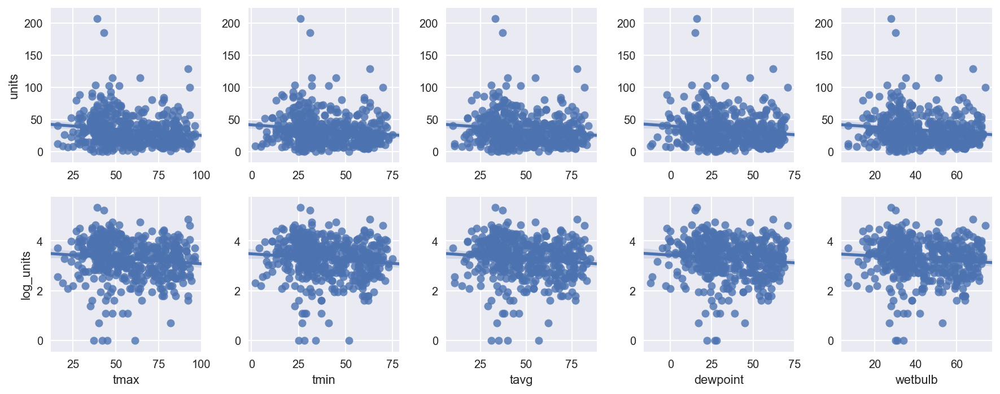

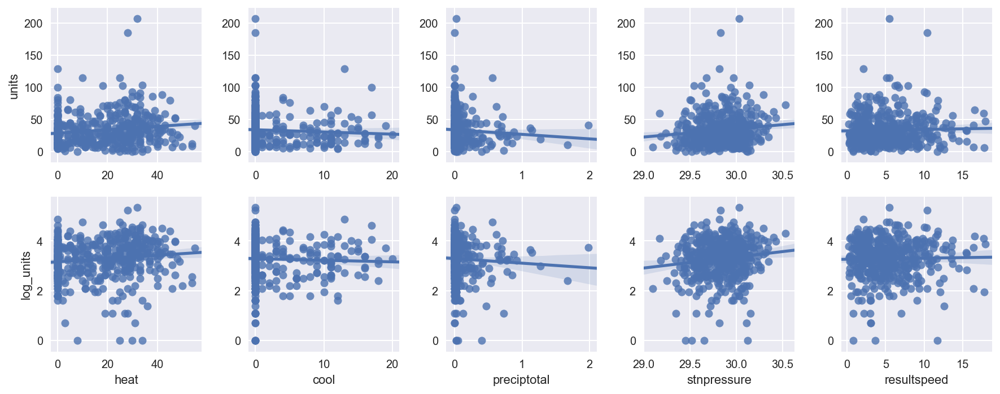

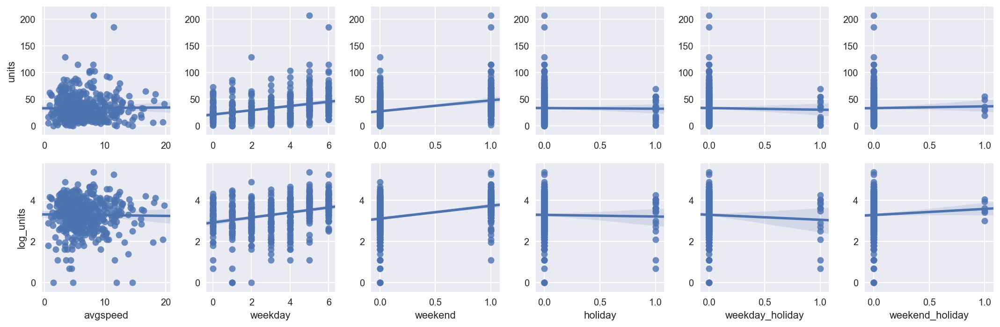

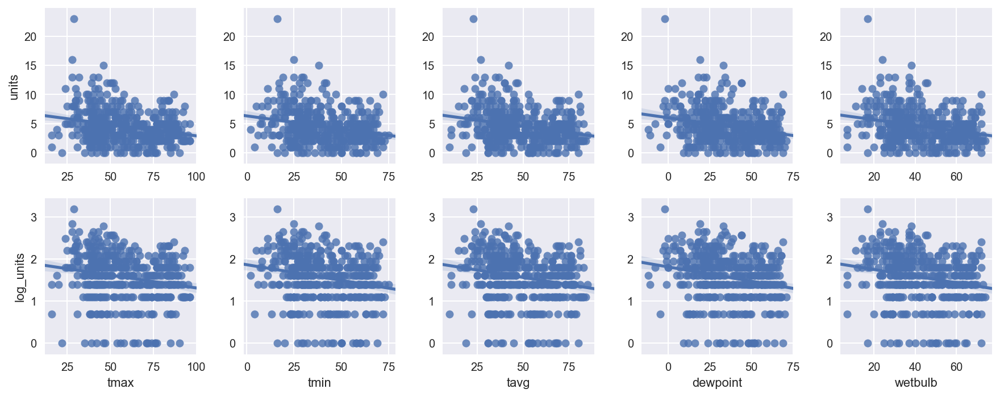

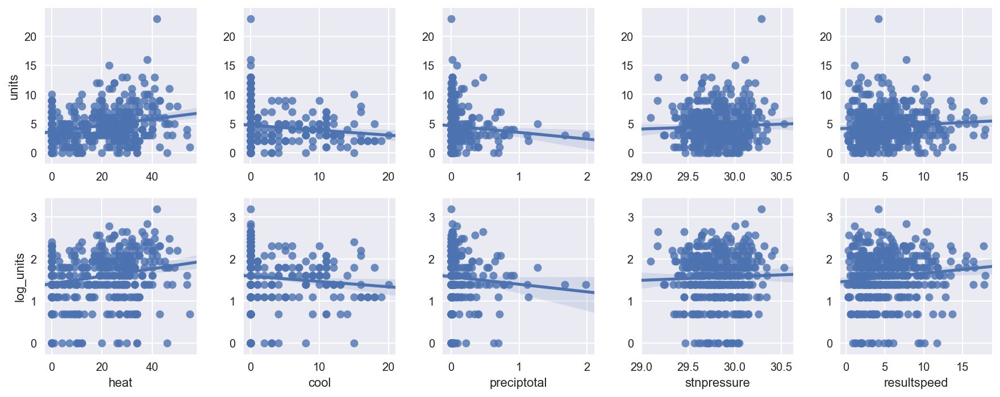

...

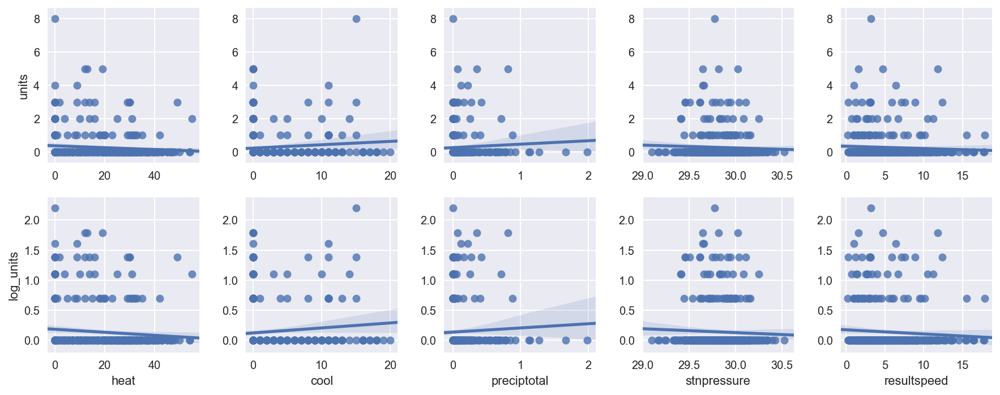

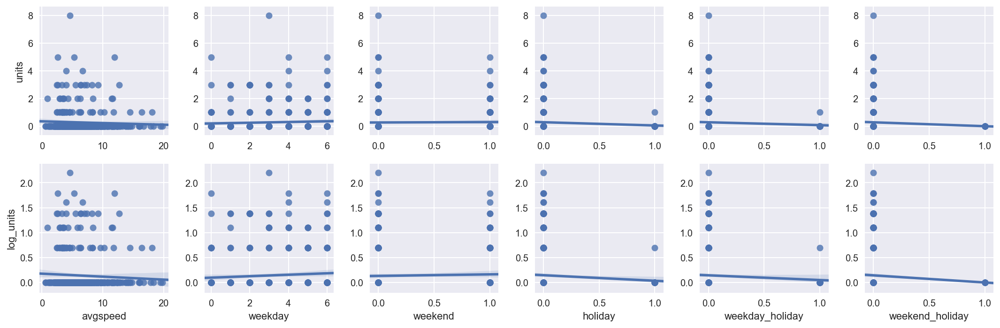

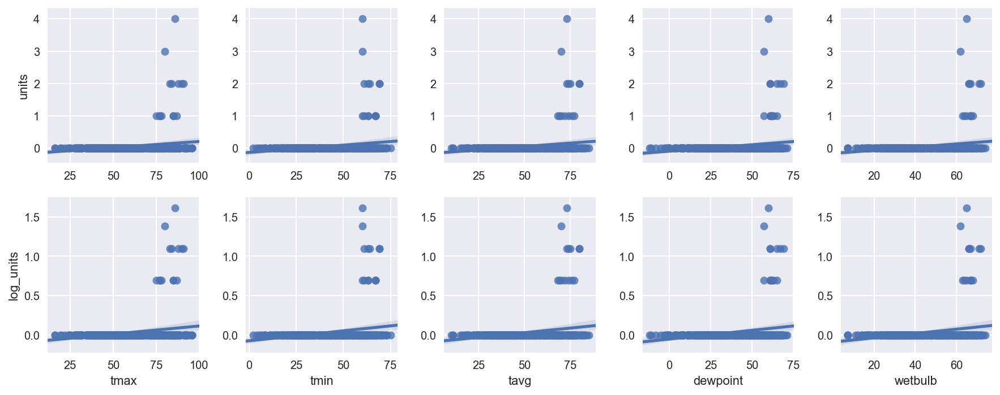

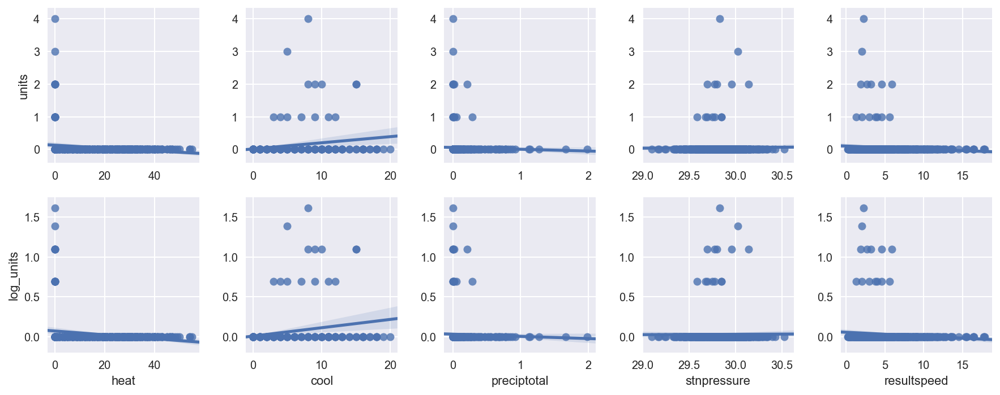

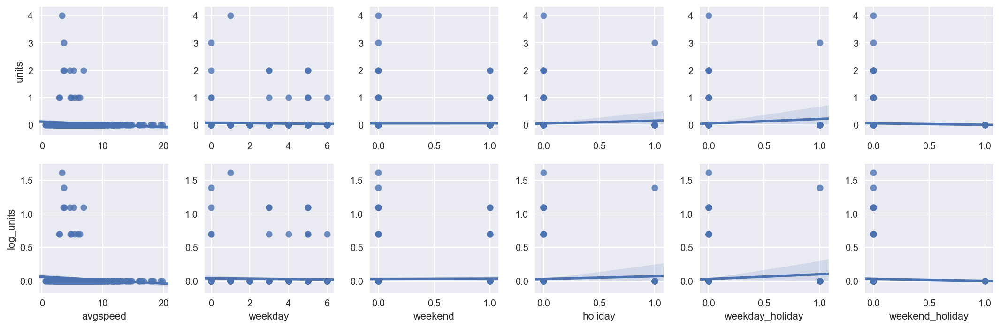

In [27]:
for station_nbr in range(1, 2) : # 1~20번 station
    weather_tmp_st = weather_tmp[weather_tmp['station_nbr'] == station_nbr].reset_index(drop = True)
    train_df_ = pd.merge(train_df, key, on = 'store_nbr')
    train_df_st = train_df_[train_df_['station_nbr'] == station_nbr]
    
    nonzero = train_df_st[train_df_st['log_units'] > 0]
    item_nbr_list = list(nonzero['item_nbr'].unique())
    
    for item_nbr in item_nbr_list :
        train_df_st_it = train_df_st[train_df_st['item_nbr'] == item_nbr]
        weather_tmp_st_it = pd.merge(weather_tmp_st, train_df_st_it, on = ['date', 'station_nbr'])
        
        sns.pairplot(weather_tmp_st_it, x_vars=['tmax', 'tmin', 'tavg', 'dewpoint', 'wetbulb'],
                     y_vars=['units', 'log_units'], kind='reg')
        plt.show()

        sns.pairplot(weather_tmp_st_it, x_vars=['heat', 'cool', 'preciptotal', 'stnpressure', 'resultspeed'],
                     y_vars=['units', 'log_units'], kind='reg')
        plt.show()

        sns.pairplot(weather_tmp_st_it, x_vars=['avgspeed', 'weekday', 'weekend', 'holiday', 'weekday_holiday', 'weekend_holiday'],
                     y_vars=['units', 'log_units'], kind='reg')
        plt.show()

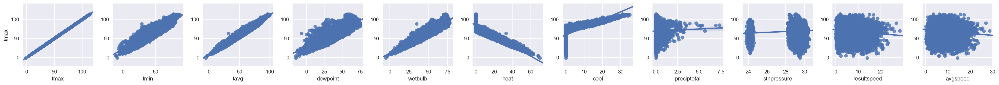

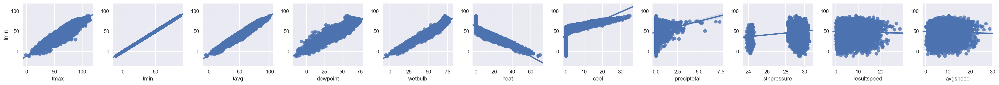

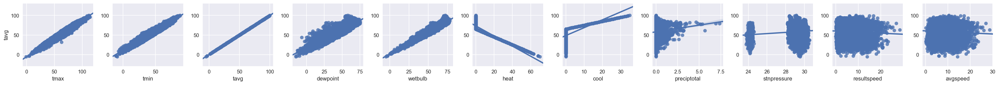

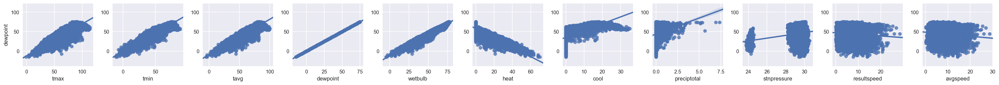

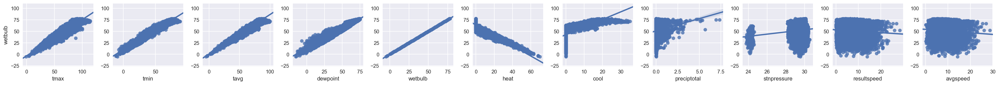

...

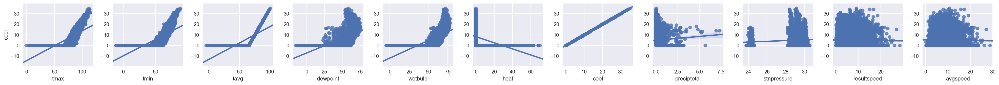

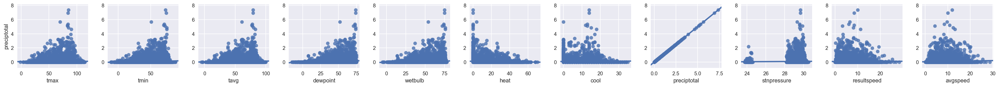

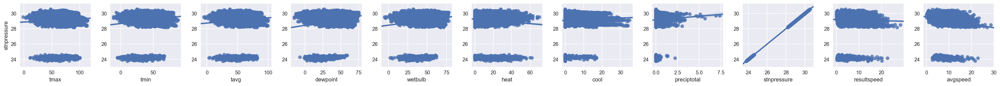

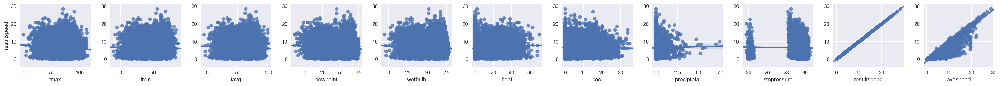

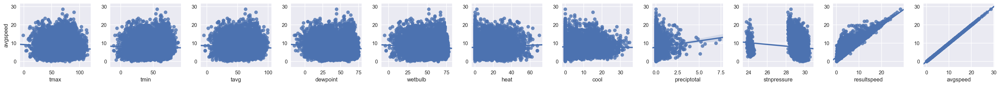

In [28]:
# weather column간 관계
sns.pairplot(weather_tmp, x_vars=['tmax', 'tmin', 'tavg', 'dewpoint', 'wetbulb', 'heat', 'cool',
       'preciptotal', 'stnpressure', 'resultspeed', 'avgspeed'], y_vars=['tmax'], kind='reg')
plt.show()
sns.pairplot(weather_tmp, x_vars=['tmax', 'tmin', 'tavg', 'dewpoint', 'wetbulb', 'heat', 'cool',
       'preciptotal', 'stnpressure', 'resultspeed', 'avgspeed'], y_vars=['tmin'], kind='reg')
plt.show()
sns.pairplot(weather_tmp, x_vars=['tmax', 'tmin', 'tavg', 'dewpoint', 'wetbulb', 'heat', 'cool',
       'preciptotal', 'stnpressure', 'resultspeed', 'avgspeed'], y_vars=['tavg'], kind='reg')
plt.show()
sns.pairplot(weather_tmp, x_vars=['tmax', 'tmin', 'tavg', 'dewpoint', 'wetbulb', 'heat', 'cool',
       'preciptotal', 'stnpressure', 'resultspeed', 'avgspeed'], y_vars=['dewpoint'], kind='reg')
plt.show()
sns.pairplot(weather_tmp, x_vars=['tmax', 'tmin', 'tavg', 'dewpoint', 'wetbulb', 'heat', 'cool',
       'preciptotal', 'stnpressure', 'resultspeed', 'avgspeed'], y_vars=['wetbulb'], kind='reg')
plt.show()
sns.pairplot(weather_tmp, x_vars=['tmax', 'tmin', 'tavg', 'dewpoint', 'wetbulb', 'heat', 'cool',
       'preciptotal', 'stnpressure', 'resultspeed', 'avgspeed'], y_vars=['heat'], kind='reg')
plt.show()
sns.pairplot(weather_tmp, x_vars=['tmax', 'tmin', 'tavg', 'dewpoint', 'wetbulb', 'heat', 'cool',
       'preciptotal', 'stnpressure', 'resultspeed', 'avgspeed'], y_vars=['cool'], kind='reg')
plt.show()
sns.pairplot(weather_tmp, x_vars=['tmax', 'tmin', 'tavg', 'dewpoint', 'wetbulb', 'heat', 'cool',
       'preciptotal', 'stnpressure', 'resultspeed', 'avgspeed'], y_vars=['preciptotal'], kind='reg')
plt.show()
sns.pairplot(weather_tmp, x_vars=['tmax', 'tmin', 'tavg', 'dewpoint', 'wetbulb', 'heat', 'cool',
       'preciptotal', 'stnpressure', 'resultspeed', 'avgspeed'], y_vars=['stnpressure'], kind='reg')
plt.show()
sns.pairplot(weather_tmp, x_vars=['tmax', 'tmin', 'tavg', 'dewpoint', 'wetbulb', 'heat', 'cool',
       'preciptotal', 'stnpressure', 'resultspeed', 'avgspeed'], y_vars=['resultspeed'], kind='reg')
plt.show()
sns.pairplot(weather_tmp, x_vars=['tmax', 'tmin', 'tavg', 'dewpoint', 'wetbulb', 'heat', 'cool',
       'preciptotal', 'stnpressure', 'resultspeed', 'avgspeed'], y_vars=['avgspeed'], kind='reg')
plt.show()

temperature와 dewpoint wetbulb, cool과 heat외에는 상관관계가 없어보인다. 상관계수를 알아보자

In [29]:
train_df['log_units'] = np.log(train_df['units'] + 1)

In [30]:
tmp = pd.merge(train_df, key, on = 'store_nbr')

In [31]:
tmp = tmp[tmp['units'] != 0]

각 weather station별로 units이 0이 아닌 item_nbr들의 units와 weather column들 간의 correlation을 살펴보자

In [32]:
# weather_tmp.drop(['RA_flag', 'FZ_flag', 'FG_flag', 'BR_flag', 'normal_flag',
#        'UP_flag', 'MI_flag', 'SN_flag', 'HZ_flag', 'TS_flag', 'VC_flag',
#        'DZ_flag', 'BL_flag', 'BC_flag', 'DU_flag', 'SQ_flag', 'PL_flag',
#        'FU_flag', 'GR_flag', 'GS_flag', 'SG_flag', 'PR_flag', 'snow_event',
#        'rain_event'], axis = 1, inplace = True)

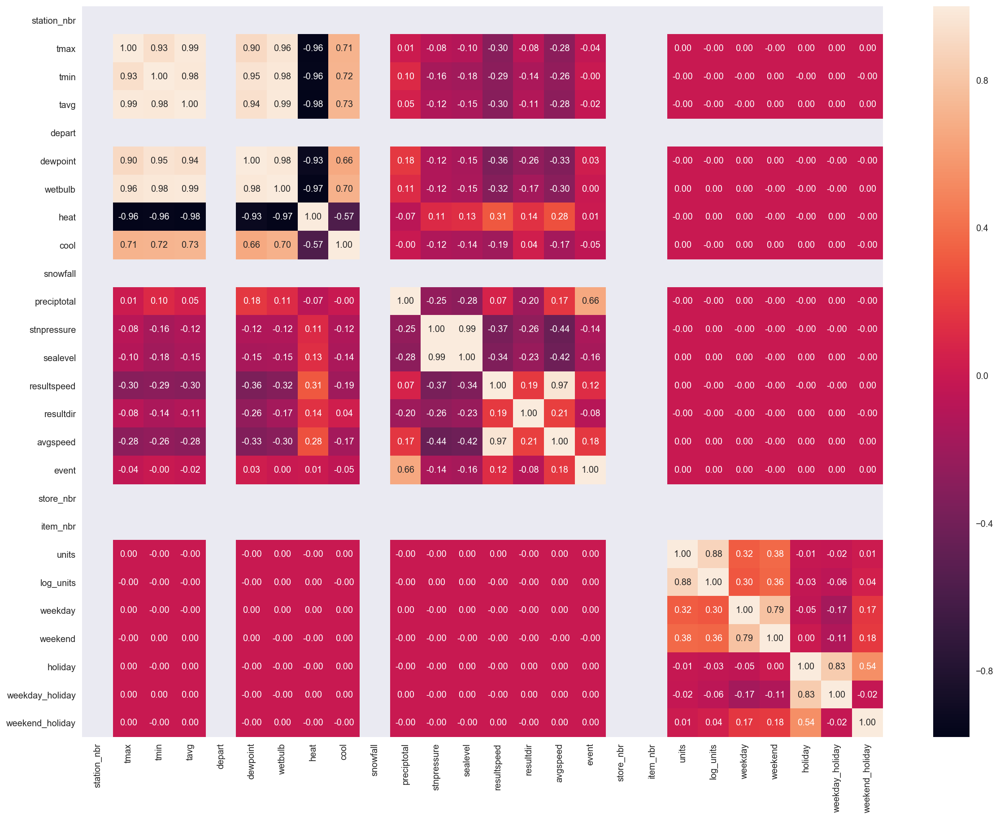

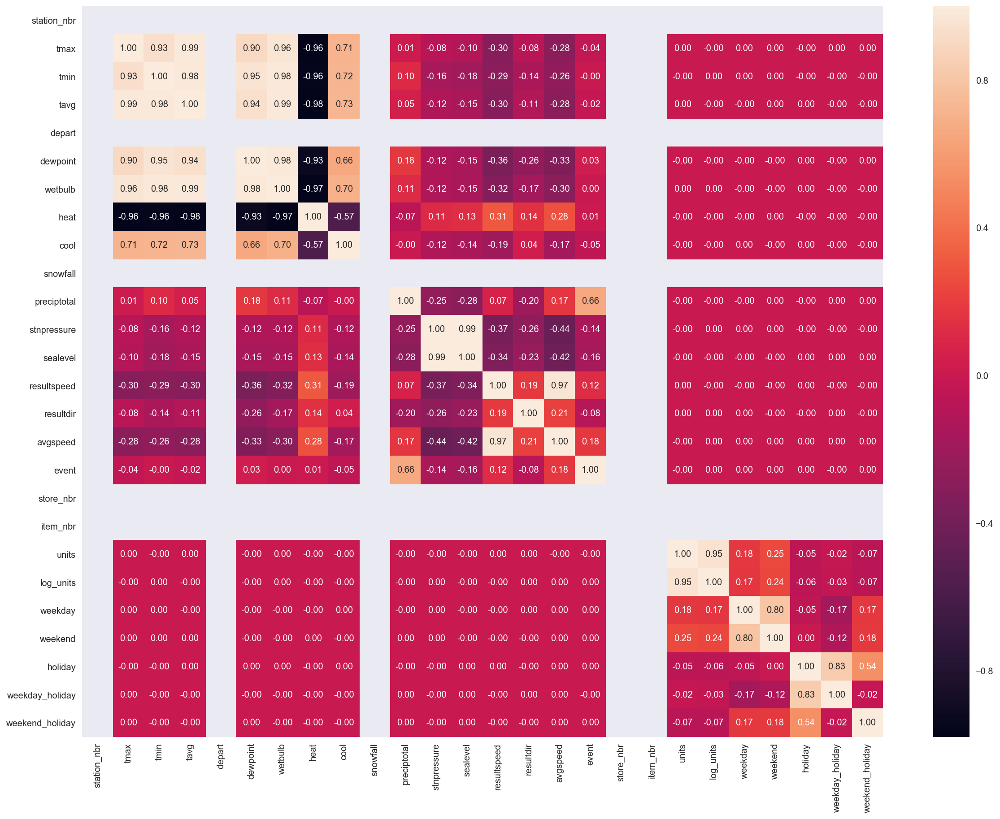

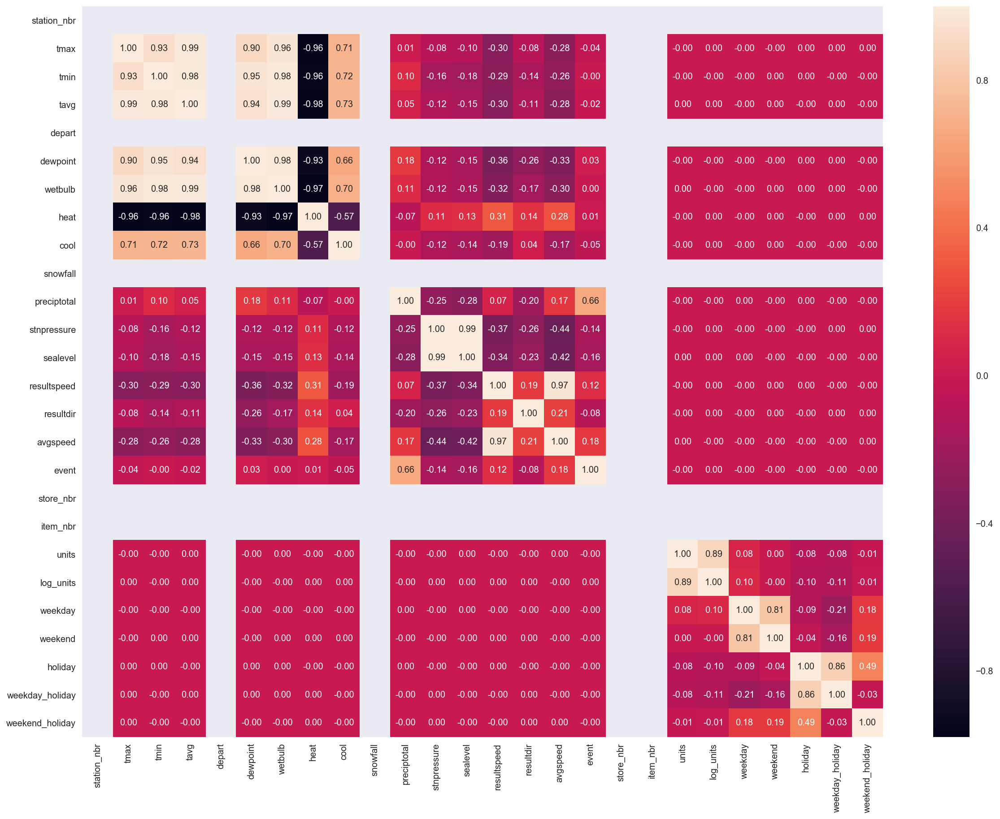

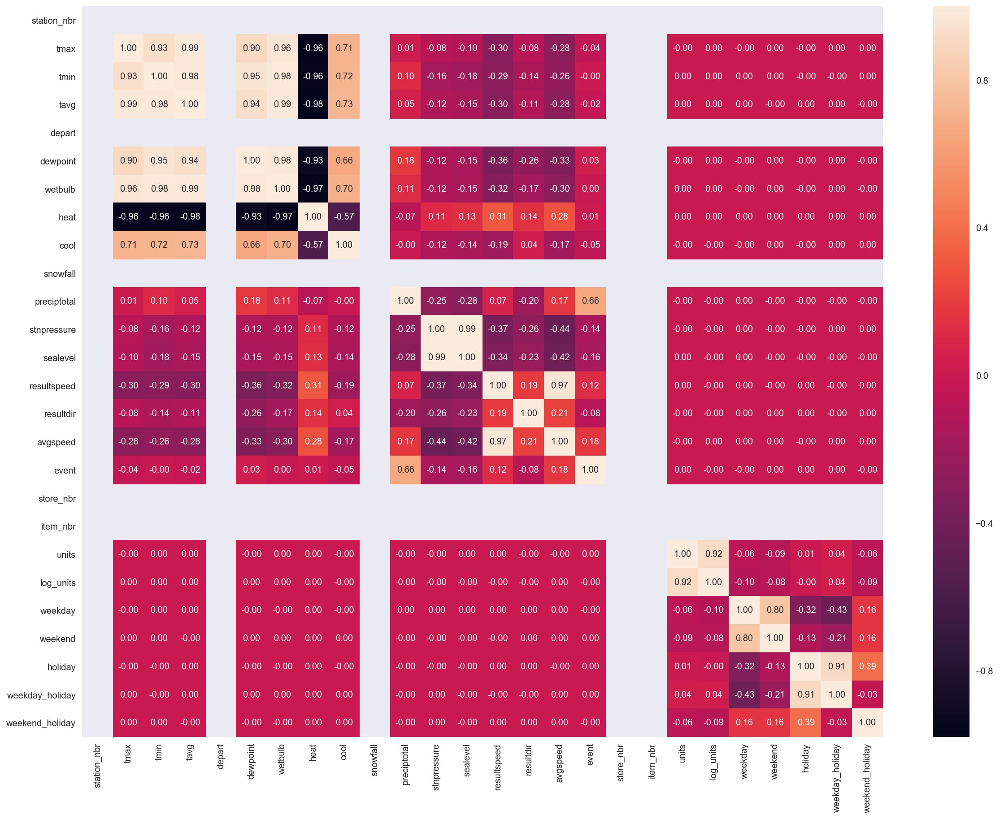

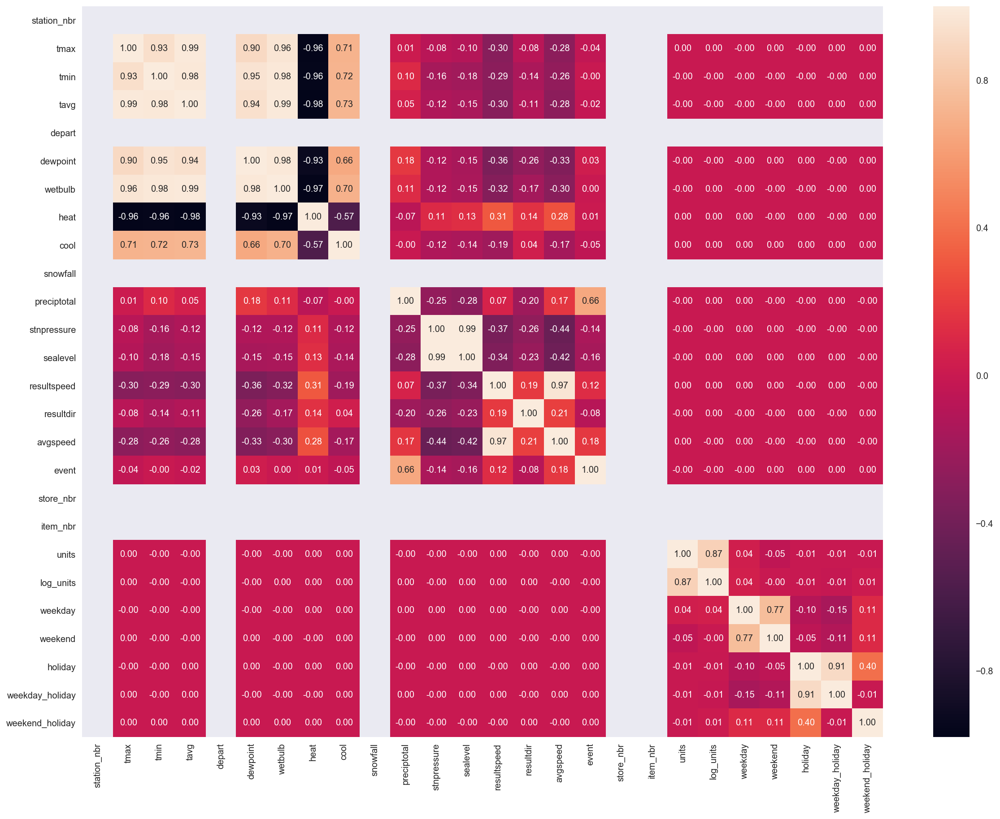

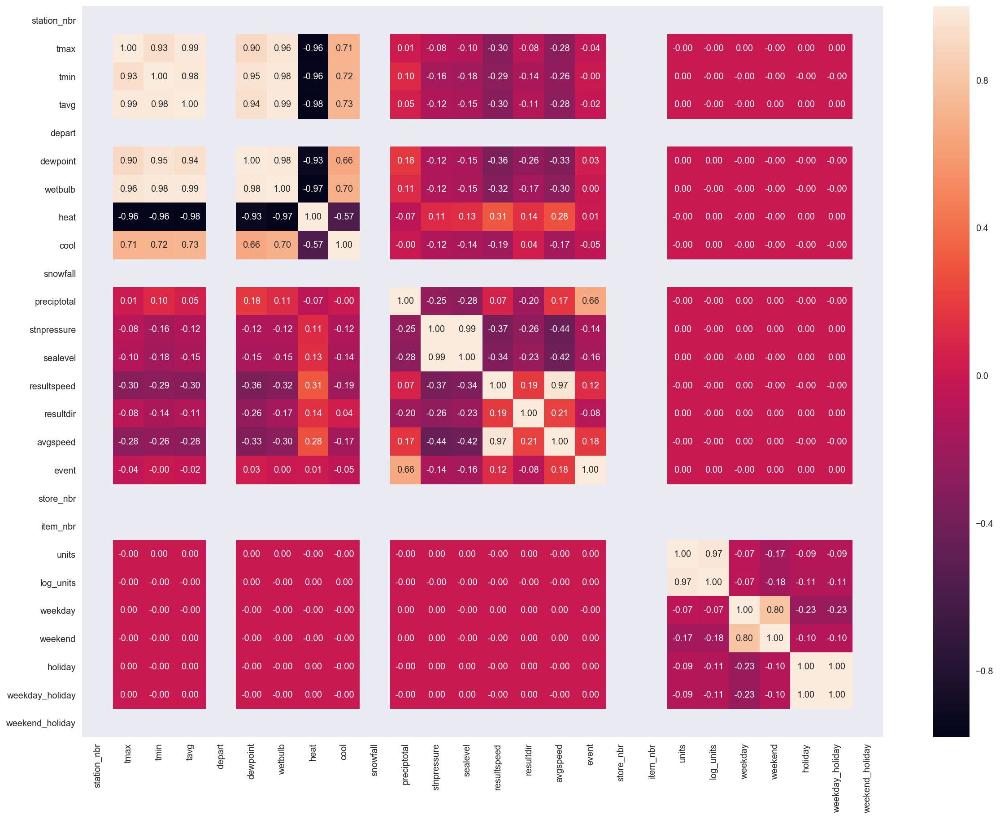

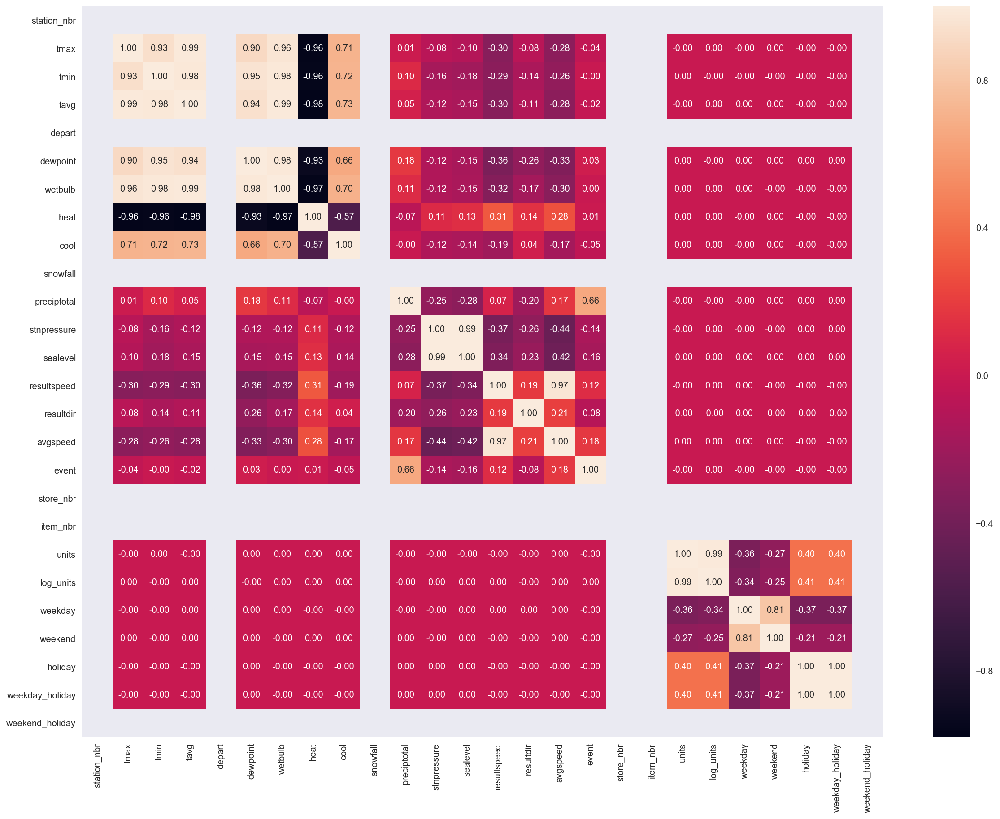

In [33]:
for x in range(1, 2) : #station_nbr은 1~20까지....
    weather_cor = weather_tmp[weather_tmp['station_nbr'] == x]
    tmp_ = tmp[tmp['station_nbr'] == x]
    weather_cor1 = pd.merge(weather_cor, tmp_, on = 'station_nbr')
    item_nbr_list = list(weather_cor1['item_nbr'].unique())

    for num in item_nbr_list :
        weather_cor_ = weather_cor1[weather_cor1['item_nbr'] == num]
        plt.figure(figsize=(20,15))
        sns.heatmap(weather_cor_.corr(), annot = True, fmt = '.2f')

우리가 관심있는 units와 log_units는 weather와는 별로 연관성이 없어보인다. 어떻게 할까?

# Feature Selection

위에서 보았다시피 각 스토어, 각 아이템별로 나누어 모델링을 해야함은 분명하다

weather와 log_units(또는 units)의 큰 상관관계는 없는 것으로 보인다.

그나마 weekday와 holiday가 log_units(또는 units)에 영향을 미치는 것으로 보인다(item_nbr에 따라 다름).